# Grouping for Synthesis AI dataset

First, we install `synthesisai` other dependencies and download test datasets.

In [ ]:
%%bash
python -m pip install synthesisai
curl https://synthesisai-example-datasets.s3.amazonaws.com/humans_api_example_dataset2.zip -o humans_api_example_dataset2.zip
unzip humans_api_example_dataset2.zip -d humans_api_example_dataset2

Now we add some imports for the visualisation.

In [91]:
%matplotlib inline

In [92]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

We use `SaiDataset` class to access synthesis datasets.

In [93]:
from synthesisai import SaiDataset, Modality, Grouping

We have different options for groupping the dataset items. `grouping=Grouping.None` was set be default in previous examples so we will showcase more advanced cases.

If `grouping=Grouping.None` is set, then each image is treated independently.
The size of the dataset is **#scenes** * **#cameras** * **#frames**.

In [94]:
data_root = "humans_api_example_dataset"
dataset = SaiDataset(data_root, grouping=Grouping.NONE)

len(dataset)

Ignoring unsupported modality Modality.CLOTHING_SEGMENTATION


114

For each item you can acess scene id, camera name and frame number.

In [95]:
item = dataset[24]
print(f"Scene ID: {item[Modality.SCENE_ID]}")
print(f"Camera name: {item[Modality.CAMERA_NAME]}")
print(f"Frame number: {item[Modality.FRAME_NUM]}")

Scene ID: 24
Camera name: default
Frame number: 1


In [96]:
def show_items(items):
    fig = plt.figure(figsize=(20, 20))
    grid = ImageGrid(fig, 111,
                     nrows_ncols=(3, 3),
                     axes_pad=0.3,
                     )

    for ax, frame in zip(grid, items):
        ax.imshow(frame[Modality.RGB])
        title = f"cam: {frame[Modality.CAMERA_NAME]} scene: {frame[Modality.SCENE_ID]} frame_no: {frame[Modality.FRAME_NUM]}"
        ax.set_title(title)
    plt.show()

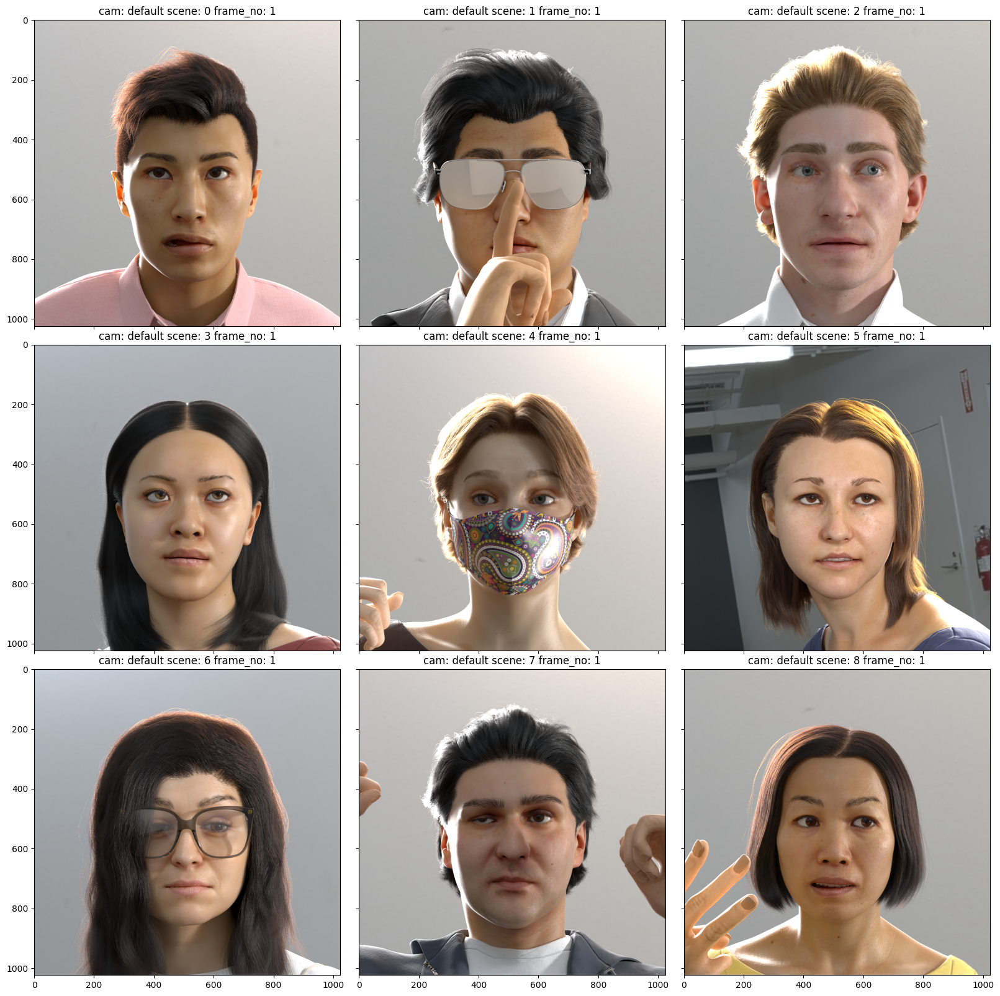

In [97]:
show_items(dataset)

If `grouping=Grouping.CAMERA` is set, then all items with the same camera are grouped into the list.

The size of the dataset is **#cameras**.

In [98]:
dataset = SaiDataset(data_root, grouping=Grouping.CAMERA)

len(dataset)

Ignoring unsupported modality Modality.CLOTHING_SEGMENTATION


6

In [99]:
group = dataset[5]
len(group)

6

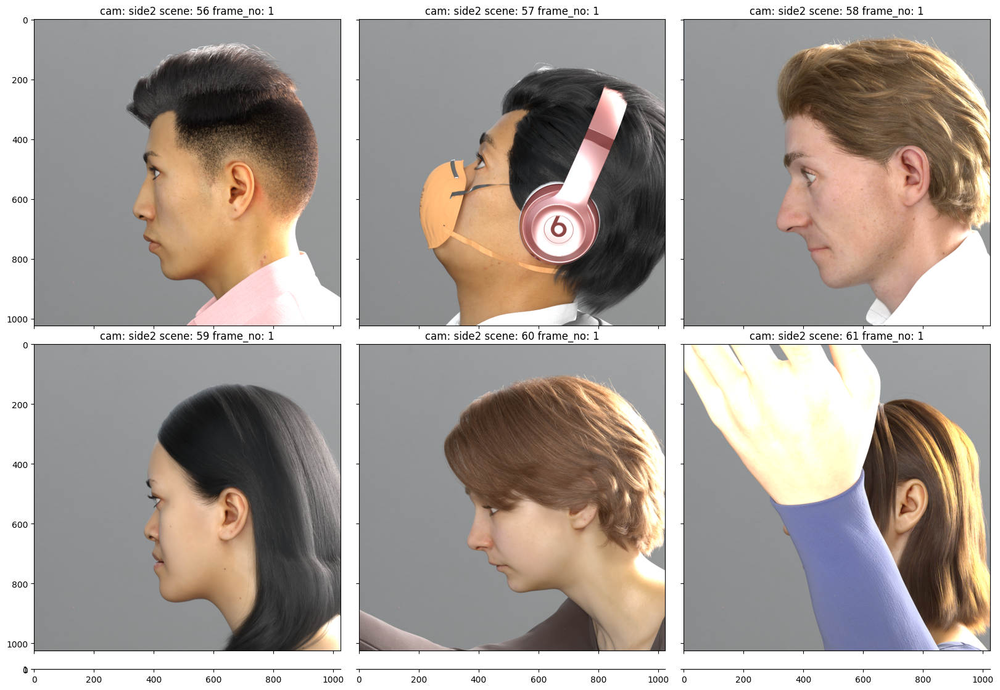

In [100]:
show_items(group)

If `grouping=Grouping.SCENE` is set, then all items with the same scene are grouped into the list.

The size of the dataset is **#scenes** , each element `List[Item]` is is a list of frames from all cameras from the same scene.

In [101]:
dataset = SaiDataset(data_root, grouping=Grouping.SCENE)

len(dataset)

Ignoring unsupported modality Modality.CLOTHING_SEGMENTATION


62

In [102]:
group = dataset[61]

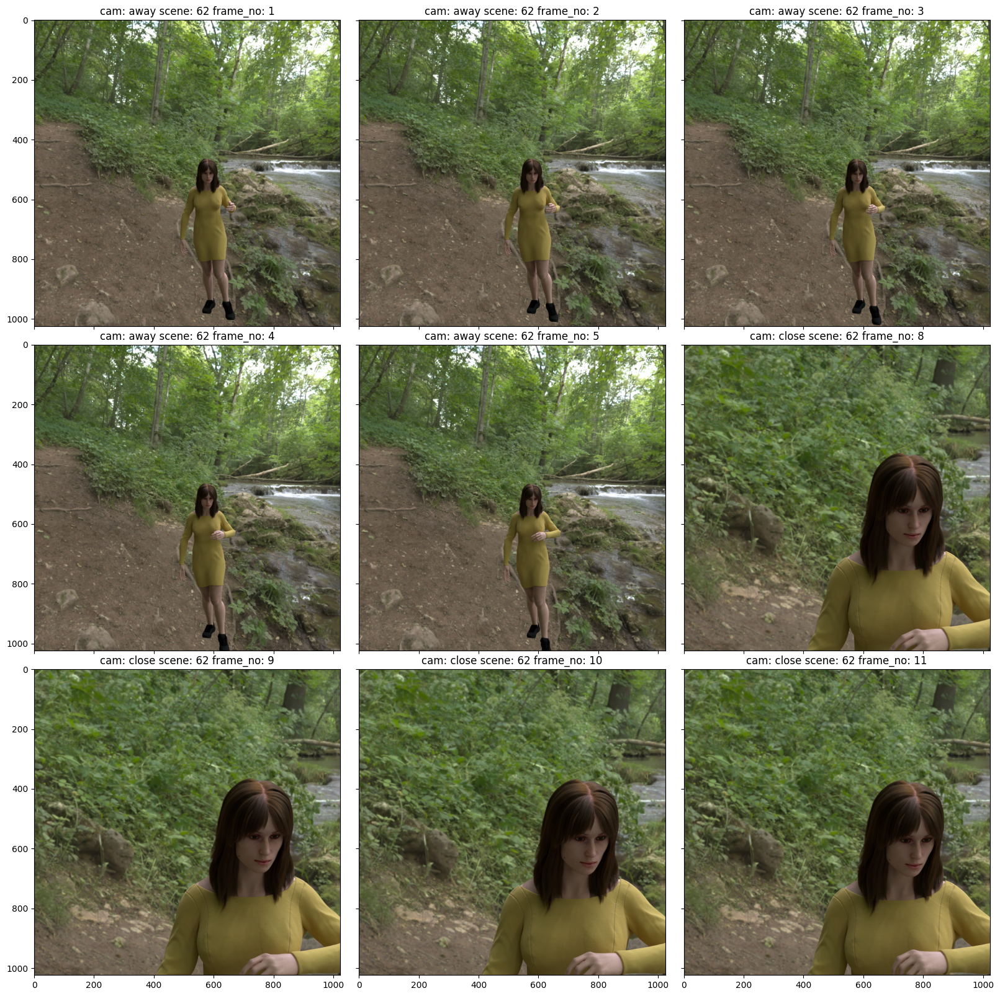

In [103]:
show_items(group[:5] + group[-5:])

If `grouping=Grouping.SCENE_CAMERA` is set, then all items are grouped first by camera and then by scene.

The size of the dataset is **#scenes** * **#cameras** , each element is a `List[Item]` is a list of consecutive frames for given scene and camera.

In [104]:
dataset = SaiDataset(data_root, grouping=Grouping.SCENE_CAMERA)

len(dataset)

Ignoring unsupported modality Modality.CLOTHING_SEGMENTATION


63

In [114]:
group = dataset[51]

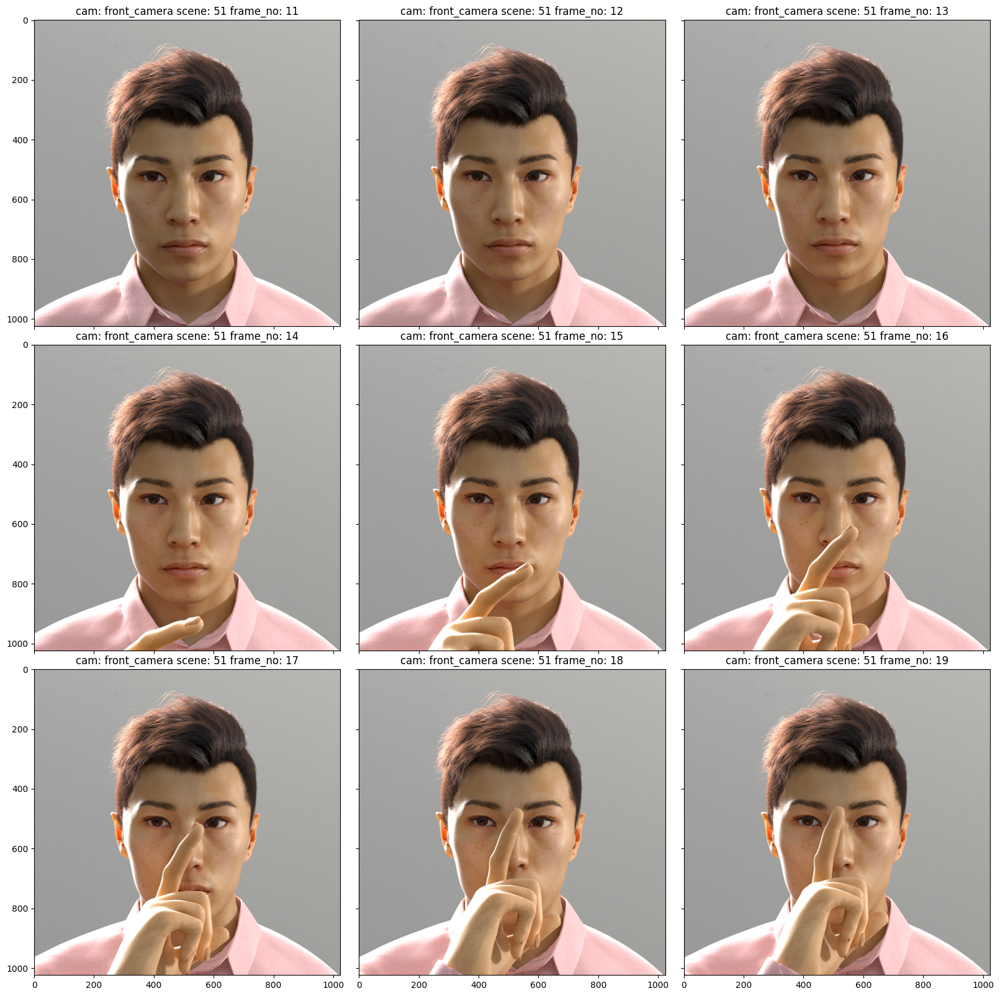

In [116]:
show_items(group[10:20])

In case you want to access your dataset items in a particular order, you can have direct access to grouping index calling `SaiDataset.get_group_index`

In [109]:
group_index = dataset.get_group_index()
group_index.head()

,SCENE_ID,CAMERA_NAME
0,0,default
1,1,default
2,2,default
3,3,default
4,4,default


Let's get all groups with `scene_id == 51`

In [117]:
query = group_index.query('SCENE_ID == 51')
query

,SCENE_ID,CAMERA_NAME
51,51,front_camera


Index  51


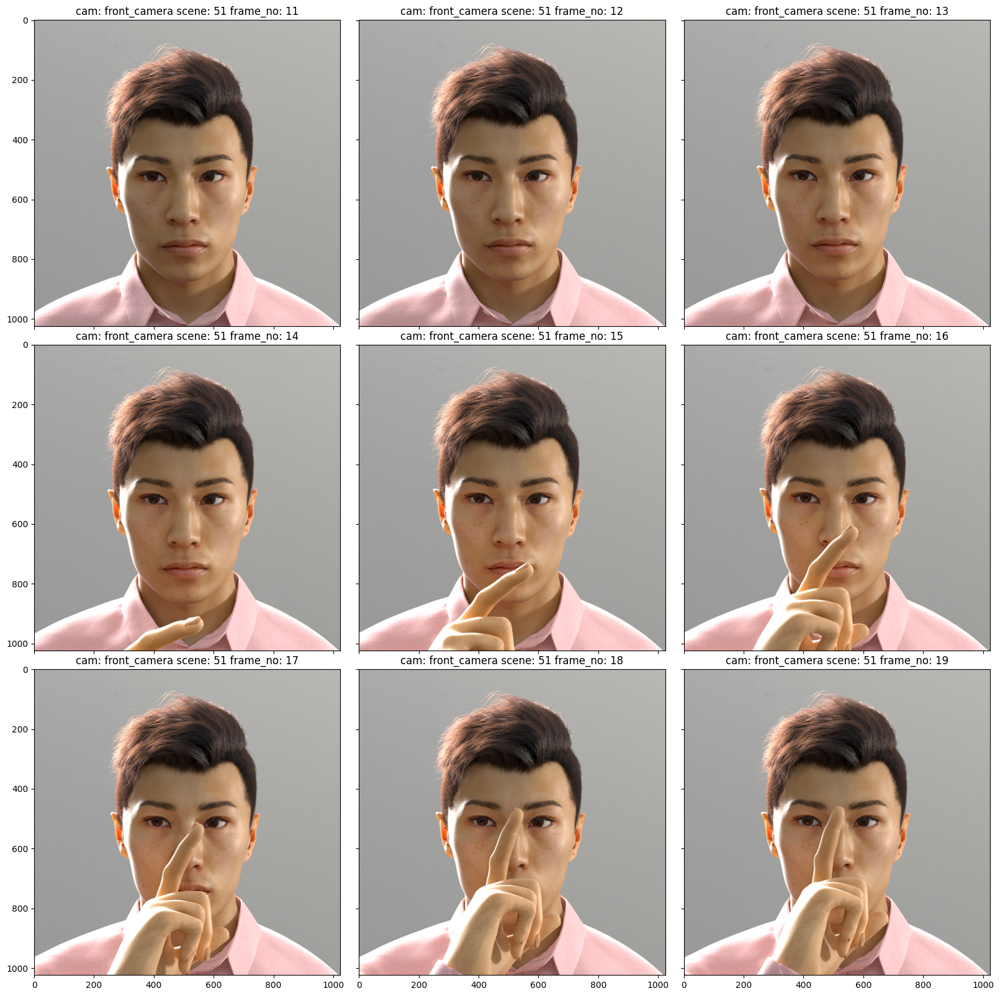

In [119]:
for idx in query.index:
    print("Index ", idx)
    group = dataset[idx]
    show_items(group[10:20])